# Dry Bean Classifier

## Librerías 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Manejo de rutas
import sys
sys.path.append("..")
import modules.utils.paths as path

# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización de datos
import seaborn as sns
import matplotlib.pyplot as plt

# Pre-procesamiento, estandarización y modelo 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import  accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import StandardScaler

# Limpieza
import janitor

sns.set()

## Lectura de datos

In [3]:
file_path = path.data_raw_dir("Dry_Bean.csv")
beans_df = pd.read_csv(file_path)
print(beans_df.shape)
beans_df.head()

(13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


Verificamos que la varaible `Class` cuente con +2 clases (multi-clase).

In [4]:
beans_df["Class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

## Limpieza de datos

Estandariación del nombre de las variables

In [5]:
beans_df = beans_df.clean_names(case_type="snake")
beans_df.columns

Index(['area', 'perimeter', 'major_axis_length', 'minor_axis_length',
       'aspect_ration', 'eccentricity', 'convex_area', 'equiv_diameter',
       'extent', 'solidity', 'roundness', 'compactness', 'shape_factor1',
       'shape_factor2', 'shape_factor3', 'shape_factor4', 'class'],
      dtype='object')

### Duplicados

In [6]:
beans_df.duplicated().sum()

np.int64(68)

In [7]:
beans_df.columns[:-1]

Index(['area', 'perimeter', 'major_axis_length', 'minor_axis_length',
       'aspect_ration', 'eccentricity', 'convex_area', 'equiv_diameter',
       'extent', 'solidity', 'roundness', 'compactness', 'shape_factor1',
       'shape_factor2', 'shape_factor3', 'shape_factor4'],
      dtype='object')

In [8]:
beans_df.duplicated().sum()

np.int64(68)

In [9]:
beans_df.drop_duplicates(inplace=True)
print("Duplicados:", beans_df.duplicated().sum())
print("Observaciones:", beans_df.shape[0])

Duplicados: 0
Observaciones: 13543


### Manejo de valores nulos

In [10]:
beans_df.isnull().sum()

area                 0
perimeter            0
major_axis_length    0
minor_axis_length    0
aspect_ration        0
eccentricity         0
convex_area          0
equiv_diameter       0
extent               0
solidity             0
roundness            0
compactness          0
shape_factor1        0
shape_factor2        0
shape_factor3        0
shape_factor4        0
class                0
dtype: int64

### Cambio de tipo de datos

In [11]:
beans_df["class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [12]:
beans_dict = {
  "SEKER": 1,
  "BARBUNYA": 2,
  "BOMBAY": 3,
  "CALI": 4,
  "HOROZ": 5,
  "SIRA": 6,
  "DERMASON": 7
}

beans_df["class_num"] = beans_df["class"].apply(lambda x: beans_dict[x])
beans_df.head()

,area,perimeter,major_axis_length,minor_axis_length,aspect_ration,eccentricity,convex_area,equiv_diameter,extent,solidity,roundness,compactness,shape_factor1,shape_factor2,shape_factor3,shape_factor4,class,class_num
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER,1
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER,1
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER,1
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER,1
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER,1


## Análisis Exploratorio de Datos

### Distribución de la variable categoríca (target) `class`.

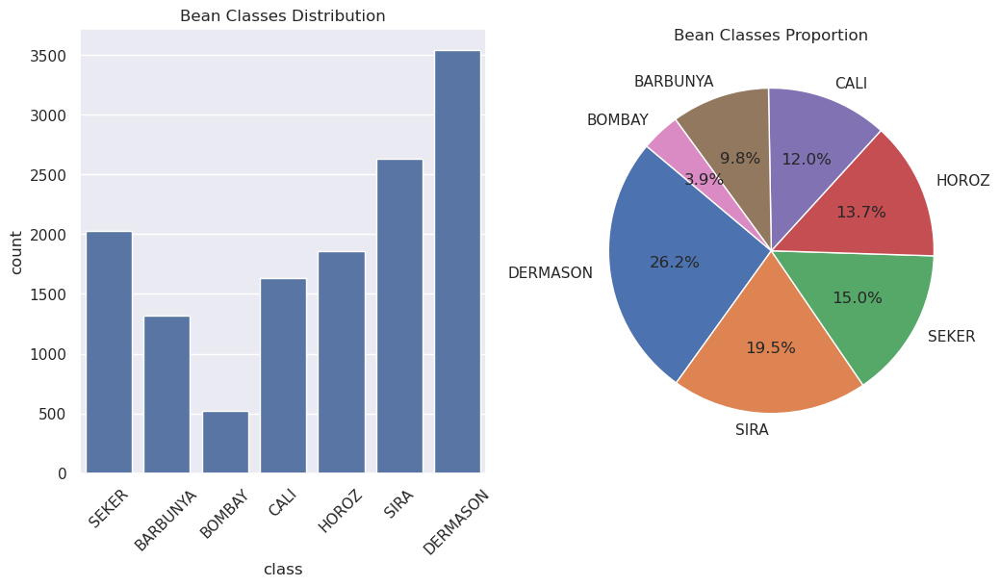

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

sns.countplot(
  data=beans_df,
  x="class",
  ax=axes[0]
)

axes[0].tick_params(axis='x', rotation=45)
axes[0].set_title("Bean Classes Distribution")

(
  beans_df["class"]
    .value_counts()
    .plot(
      kind="pie",
      ax=axes[1],
      title="Bean Classes Proportion",
      ylabel="",
      autopct="%1.1f%%",
      startangle=140
    )
)

plt.show()

**Observciones**:
- Claro desbalance entre todas las clases.
- Clase predominante `DERMASON`
- Clase minoritaria `BOMBAY`
- La diferencia entre la clase predominante y la minoritaria es de +3000 observaciones.

Para entrenar el modelo de Regresión Logística se debe contar con un dataset balanceado, por lo tanto debemos aplicar técnicas de balanceo de datos, ya se de sobremuestreo (aumento de observaciones de las clases minoritarias) o de submuestreo (eliminación de observaciones de las clases predominantes).

O bien es posible implementar una combianción de ambas técnicas con un Pipeline.

### Análisis de correlaciones

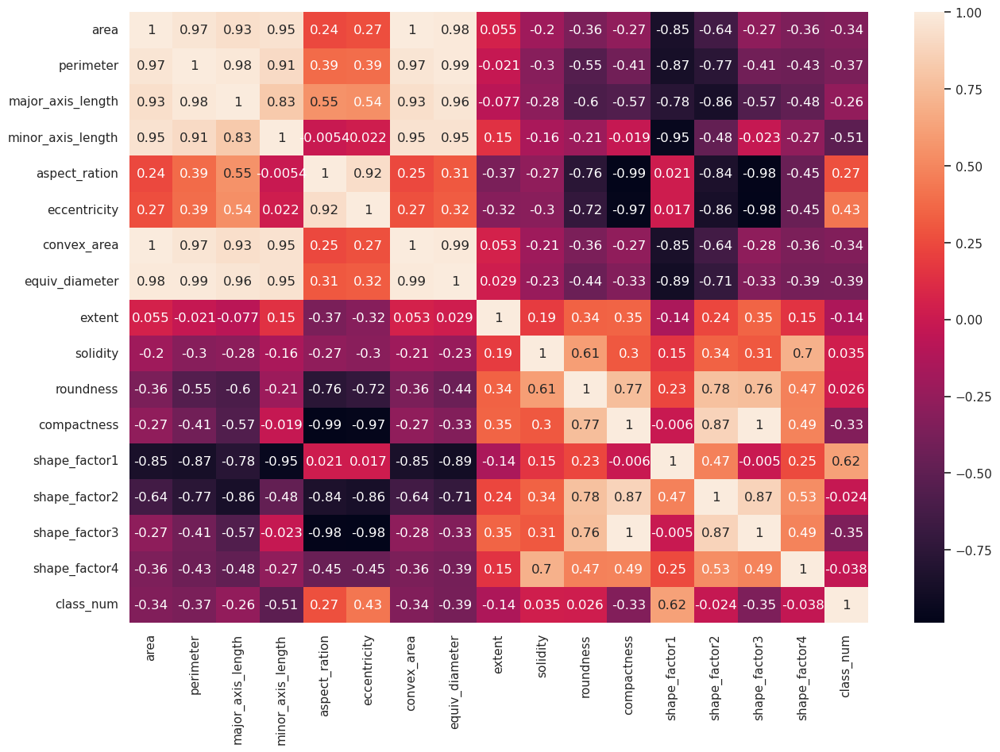

In [14]:
corr = beans_df.drop(columns=["class"]).corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True)
plt.show()

**Observaciones**
- En general encontramos varias características correlacionadas entre si.
- Las características  `convex_area` y `equiv_diameter` son las que aportan mayor correlación a la variable `area`, lo cuál puede indicar que esas 3 variables describan lo mismo.

📌 Eliminaresmos las variables `convex_area` y `equiv_diameter`.

In [15]:
processed_df = beans_df.drop(columns=["convex_area", "equiv_diameter"])

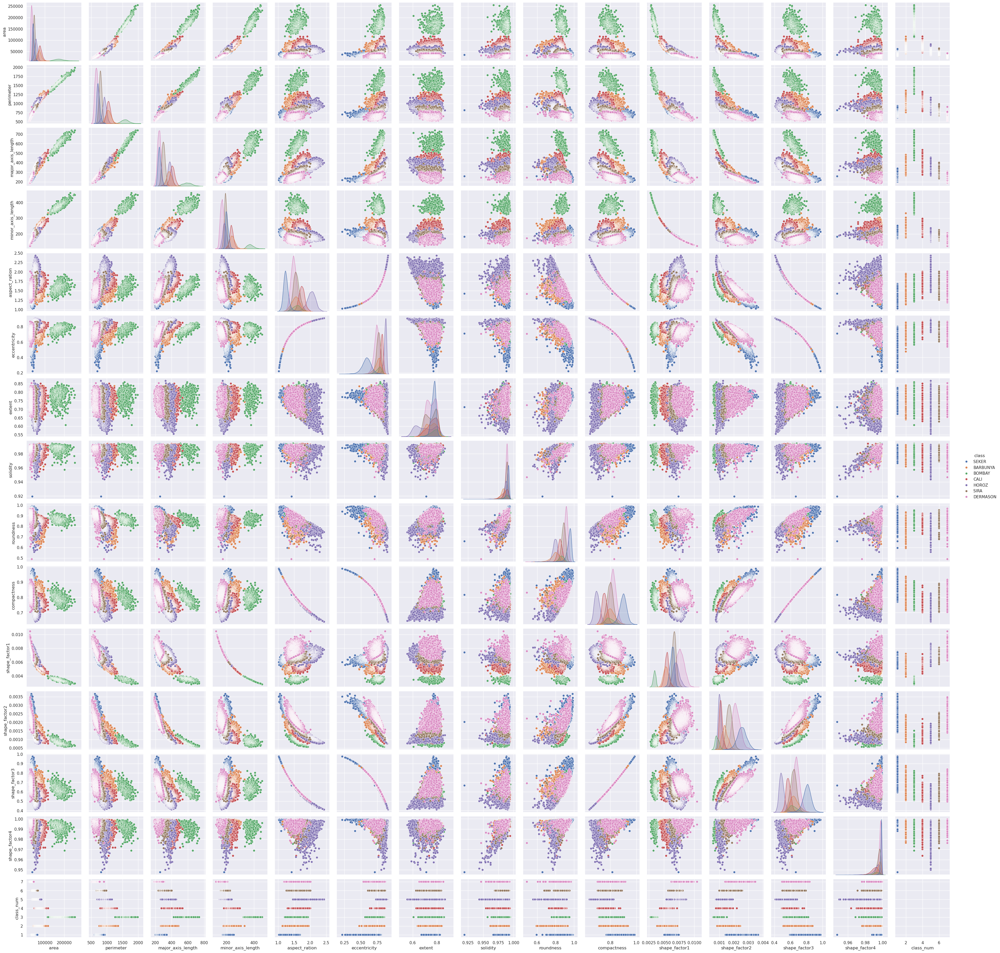

In [16]:
sns.pairplot(processed_df, hue="class")
plt.show()

**Observaciones**
- A simple vista existe una clara segentación de los datos respecto a la variable clase, lo cual hace a los datos altamente clasificables.

## Split de datos en entrenamiento y pruebas

Antes de balancear los datos, los dividimos en un set de entrenamiento y pruebas, de esta forma nos aseguramos probar al modelo con los datos originales del dataset.

In [17]:
X = processed_df.drop(columns=["class", "class_num"])
y = processed_df["class_num"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=.2, shuffle=True)
print("Total de observaciones para entrenamiento", X_train.shape[0])
print("Total de observaciones para pruebas", X_test.shape[0])

Total de observaciones para entrenamiento 10834
Total de observaciones para pruebas 2709


## Balanceo de clases

In [18]:
from collections import Counter

print("Clases para el entrenamiento:", Counter(y_train))
print("Clases para pruebas:", Counter(y_test))

Clases para el entrenamiento: Counter({7: 2839, 6: 2102, 1: 1613, 5: 1484, 4: 1325, 2: 1063, 3: 408})
Clases para pruebas: Counter({7: 707, 6: 534, 1: 414, 5: 376, 4: 305, 2: 259, 3: 114})


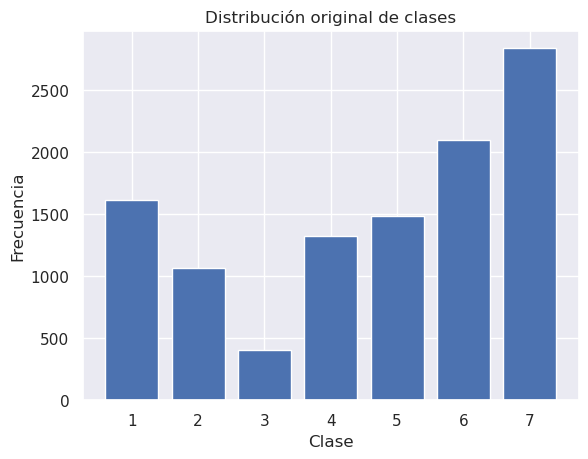

In [19]:
# Distribución original
plt.bar(*zip(*Counter(y_train).items()))
plt.title('Distribución original de clases')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.show()

Dado abrupto desbalance en las clases, utilizaremos la combinación de oversampling y undersampling por medio de un Pipeline.
- `undersampling`: Reducción de las clases predominantes hasta la misma cantidad de observaciones que la clase minoritaria.
- `oversampling`: Creación sistemática de observaciones en las clases minoritarias hasta alcanzar el número de observaciones de la clase predominante.

In [20]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

under = RandomUnderSampler(sampling_strategy={7:500}) # Reducira 500 observaciones de la clase 7->DERMASON
smote = SMOTE(sampling_strategy="not majority") # Aumentará el número de observaciones de las otras clases.

# Pipie line de re muestreo
resample_pipeline = Pipeline([
    ('under', under),
    ('smote', smote)
])

X_resampled, y_resampled = resample_pipeline.fit_resample(X_train, y_train)

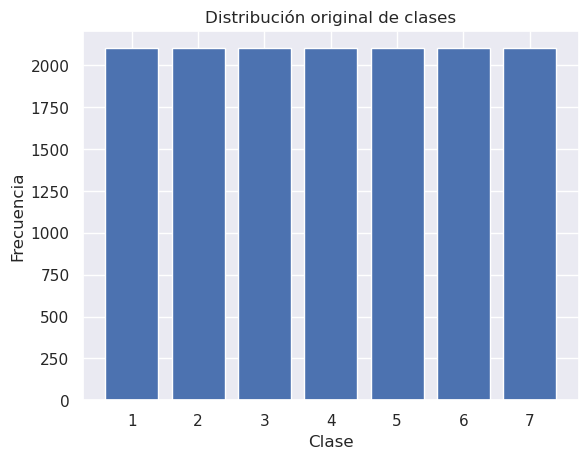

In [21]:
# Distribución balanceada
plt.bar(*zip(*Counter(y_resampled).items()))
plt.title('Distribución original de clases')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.show()

## Escalamiento de los datos

In [32]:
# Creamos el Scaler 
scaler = StandardScaler()

# Estandarizamos los datos
X_train_scaled = scaler.fit_transform(X_resampled)
X_test_scaled = scaler.transform(X_test)

## Entrenamiento

Entrenaremos el modelo de regesión logística con los parámetros por default:
- `solver`: `lbfgs`.
- `multi_class`: `auto`

Posteriormente buscaremos los mejores parámetros de entrenamiento con `GridSearchCV`.

In [33]:
model = LogisticRegression()
model.fit(X_train_scaled, y_resampled)

LogisticRegression()

## Evaluación del modelo

In [47]:
predictions = model.predict(X_test_scaled)
accuracy = accuracy_score(y_true=y_test, y_pred=predictions)
print(f"Accuracy: {accuracy*100:.2f}%")

Accuracy: 91.33%


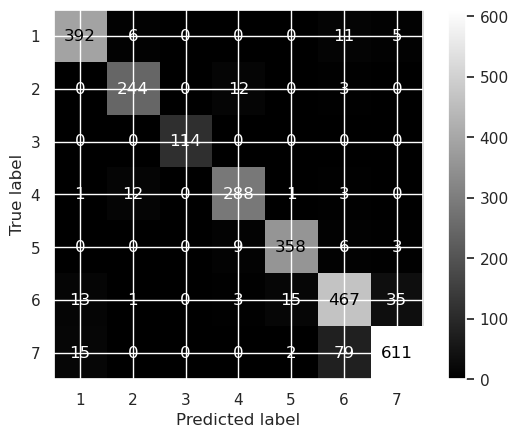

In [48]:
cm = confusion_matrix(y_true=y_test, y_pred=predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap="gray")
plt.show()

### Mejores parametros de entrenamiento 

In [49]:
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings("ignore")

parameters = {
  "solver": ["newton-cg", "lbfgs", "liblinear", "saga", "sag"],
  "multi_class": ["ovr", "multinomial"]
}

model_lr = LogisticRegression()
clf = GridSearchCV(
  model_lr,
  param_grid=parameters,
  scoring="accuracy",
  cv=10
)

clf.fit(X_train_scaled, y_resampled)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga',
                                    'sag']},
             scoring='accuracy')

In [50]:
print("Mejores parámetros:", clf.best_params_)
print("Mejor accuracy:", clf.best_score_)

Mejores parámetros: {'multi_class': 'multinomial', 'solver': 'newton-cg'}
Mejor accuracy: 0.9430492233913637


In [51]:
predictions = clf.predict(X_test_scaled)
accuracy = (accuracy_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(f"Accuracy: {accuracy*100:.2f}%")

[[392   6   0   0   0  11   5]
 [  0 244   0  12   0   3   0]
 [  0   0 114   0   0   0   0]
 [  1  12   0 288   1   3   0]
 [  0   0   0   9 358   6   3]
 [ 13   1   0   3  15 467  35]
 [ 15   0   0   0   2  79 611]]
Accuracy: 91.33%


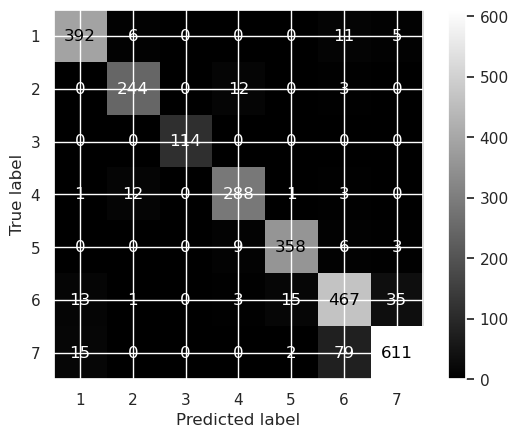

In [52]:
cm = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot(cmap="gray")
plt.show()

In [53]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           1       0.93      0.95      0.94       414
           2       0.93      0.94      0.93       259
           3       1.00      1.00      1.00       114
           4       0.92      0.94      0.93       305
           5       0.95      0.95      0.95       376
           6       0.82      0.87      0.85       534
           7       0.93      0.86      0.90       707

    accuracy                           0.91      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.91      0.91      0.91      2709



Cross validation score: 0.9423684956387541
Accuracy 0.9132521225544481


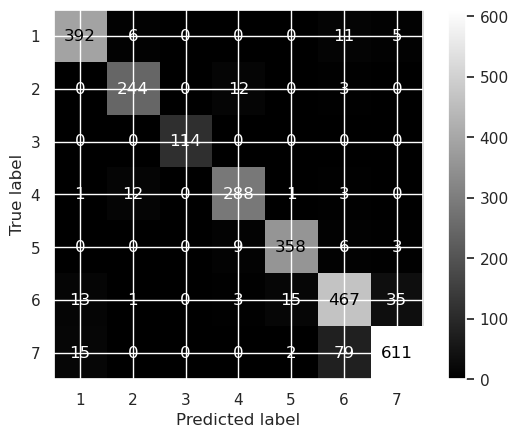

In [54]:
from sklearn.model_selection import cross_val_score
model = LogisticRegression(solver="newton-cg", multi_class="multinomial")
model.fit(X_train_scaled, y_resampled)

scores = cross_val_score(model, X_train_scaled, y_resampled, cv=5)
print("Cross validation score:", scores.mean())

predictions = model.predict(X_test_scaled)
print("Accuracy", accuracy_score(y_test, predictions))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap="gray")
plt.show()
